In [1]:
#pip install python-snappy
import snappy
from snappy import ProductIO
from snappy import HashMap
from snappy import WKTReader
import os, gc   
from snappy import GPF

In [2]:
file = "C:\\Users\\arind\\Desktop\\Remote Sensing Arindam\\S1A_IW_GRDH_1SDV_20221226T000500_20221226T000525_046495_059224_A84C.zip"

### Downloaded File Descriptions

In [23]:
print("Reading...")
product = ProductIO.readProduct(file)
width = product.getSceneRasterWidth()
height = product.getSceneRasterHeight()
name = product.getName()
description = product.getDescription()
band_names = product.getBandNames()

print("Product:     %s, %s" % (name, description))
print("Raster size: %d x %d pixels" % (width, height))
print("Start time:  " + str(product.getStartTime()))
print("End time:    " + str(product.getEndTime()))
print("Bands:       %s" % (list(band_names)))

#del product
print('------------------------------------------------------------------------------')
print("Image Removed, will read it again later when required in a more proper way.")

Reading...
Product:     S1A_IW_GRDH_1SDV_20221226T000500_20221226T000525_046495_059224_A84C, Sentinel-1 IW Level-1 GRD Product
Raster size: 25674 x 16735 pixels
Start time:  26-DEC-2022 00:05:00.817852
End time:    26-DEC-2022 00:05:25.816913
Bands:       ['Amplitude_VH', 'Intensity_VH', 'Amplitude_VV', 'Intensity_VV']
------------------------------------------------------------------------------
Image Removed, will read it again later when required in a more proper way.


In [31]:
print(product.getGcpGroup())

org.esa.snap.core.datamodel.PlacemarkGroup[name=ground_control_points]


### Sentinel 1 Image Analysis and Hands on 

In [4]:
import matplotlib.colors as colors
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from termcolor import colored
from zipfile import ZipFile
from os.path import join
from glob import iglob
import pandas as pd
import numpy as np
import subprocess
import warnings
warnings.filterwarnings('ignore')

In [5]:
output_bands = ['Amplitude_VV', 'Amplitude_VH']

## Visualization Function

In [6]:
def output_view(product,band,min_value_VV,max_value_VV,min_value_VH,max_value_VH, ):
    '''
    Creaates visualization of processed Sentinel-1 SAR data; Will be usefull to
    check results after each step of the data pre-processing.
    
    Parameters:
    pre_proc_step  -- str --> pre-processing step
    product        -- snappy GPF product ---> input Sentinel-1 product
    band           -- List --> product bands to be visualized
    min_value_VV   -- int --> min value for color stretch in VV band
    max_value_VV   -- int --> max value for color stretch in VV band
    min_value_VH   -- int --> min value for color stretch in VH band
    max_value_VH   -- int --> max value for color stretch in VH band
    '''
    print()
    band_data_list = []
    for i in band:
        band = product.getBand(i)
        w = band.getRasterWidth()
        h = band.getRasterHeight()
        band_data = np.zeros(w*h, np.float32)
        band.readPixels(0, 0, w, h, band_data)
        band_data.shape = h, w
        band_data_list.append(band_data)
        
    fig, (ax1,ax2) = plt.subplots(1,2)
    fig.set_figheight(25)
    fig.set_figwidth(25)
    ax1.imshow(band_data_list[0], cmap='gray', vmin= min_value_VV, vmax =max_value_VV )
    ax1.set_title(output_bands[0])
    #ax1.figsize(10,10)
    ax2.imshow(band_data_list[1], cmap='gray', vmin= min_value_VH, vmax =max_value_VH )
    ax2.set_title(output_bands[1])
    #ax2.figsize(10,10)
    for ax in fig.get_axes():
        ax.label_outer()
        
    

### Using command-line, check documentation of different preprocessing-steps, parameters etc within SNAPPY

In [7]:
print(subprocess.Popen(['gpt', '-h', 'Speckle-Filter'], stdout=subprocess.PIPE, universal_newlines=True).communicate()[0])

Usage:
  gpt Speckle-Filter [options] 

Description:
  Speckle Reduction


Source Options:
  -Ssource=<file>    Sets source 'source' to <filepath>.
                     This is a mandatory source.

Parameter Options:
  -PanSize=<int>                              The Adaptive Neighbourhood size
                                              Valid interval is (1, 200].
                                              Default value is '50'.
  -PdampingFactor=<int>                       The damping factor (Frost filter only)
                                              Valid interval is (0, 100].
                                              Default value is '2'.
  -Penl=<double>                              The number of looks
                                              Valid interval is (0, *).
                                              Default value is '1.0'.
  -PestimateENL=<boolean>                     Sets parameter 'estimateENL' to <boolean>.
                                      

### Read product and Quick-look

,Name,Sensing Mode,Product Type,Polarization,Height,Width,Band Names
0,S1A_IW_GRDH_1SDV_20221226T000500_20221226T0005...,IW,GRDH,1SDV,16735,25674,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Int..."


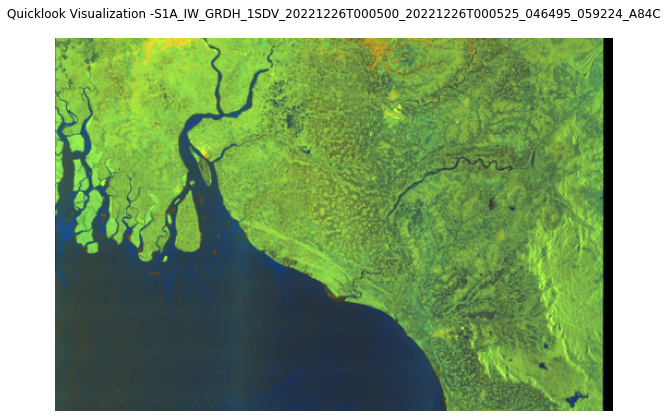

In [8]:
# Intensity is directly proportional to the square of Amplitude.
product_path = 'C:/Users/arind/Desktop/Remote Sensing Arindam/'
input_S1_files = sorted(list(iglob(join(product_path, '**', '*S1*.zip'), recursive=True)))
name, sensing_mode, product_type, polarization, height, width, band_names = ([] for i in range(7))
for i in input_S1_files:
    sensing_mode.append(i.split("_")[1])
    product_type.append(i.split("_")[2])
    polarization.append(i.split("_")[-6])
    # To get metadata related informtation, now reading with snappy
    s1_read = snappy.ProductIO.readProduct(i)
    name.append(s1_read.getName())
    height.append(s1_read.getSceneRasterHeight())
    width.append(s1_read.getSceneRasterWidth())
    band_names.append(s1_read.getBandNames())
    
df_s2_read = pd.DataFrame({'Name': name,
                           'Sensing Mode': sensing_mode,
                           'Product Type': product_type,
                           'Polarization': polarization,
                           'Height': height,
                           'Width': width,
                           'Band Names': band_names
                          })
display(df_s2_read)

# Display quick-look image provided with the product
with ZipFile(input_S1_files[0], 'r') as qck_look:
    qck_look = qck_look.open(name[0] + '.SAFE/preview/quick-look.png')
    img = mpimg.imread(qck_look)
    plt.figure(figsize=(10,10))
    plt.title('Quicklook Visualization -' +  name[0] + '\n')
    plt.axis('off')
    plt.imshow(img);

### Subset

['Amplitude_VH', 'Intensity_VH', 'Amplitude_VV', 'Intensity_VV']



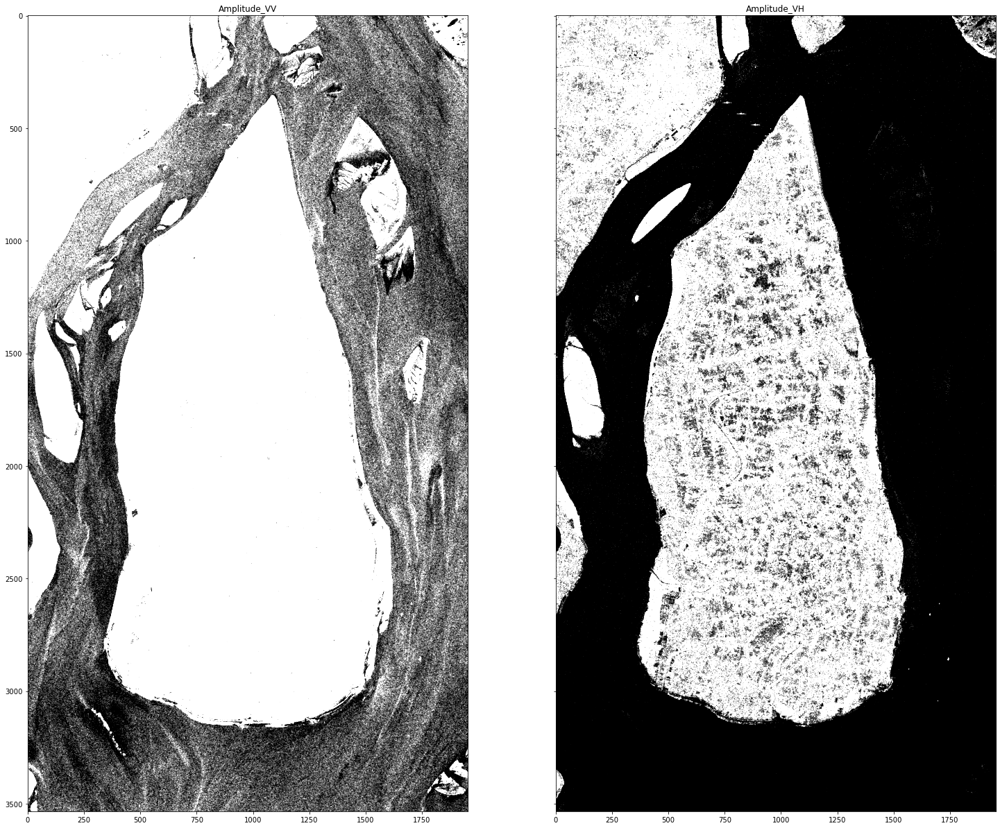

In [9]:
# using Polygon, can be done using pixel co-ordinates as well
#wkt = "Polygon(( 87.896943 22.290794, 87.911464 22.290790 , 87.913360 22.274493 , 87.900032 22.278462,  87.896943 22.290794 ))"
#wkt = "POLYGON((87.920837 22.372126 , 87.926837 22.372093, 87.928908 22.366999 , 87.930446 22.359277, 87.931949 22.353212 , 87.934567 22.350636 , 87.931190 22.350214 , 87.927357 22.350721 , 87.925897 22.352410, 87.925623 22.355871 , 87.923068 22.359585 , 87.923981 22.364480 ,87.924438 22.367688 , 87.921517 22.368279 , 87.920878 22.370727, 87.920837 22.372126 ))"

wkt = "POLYGON((88.082197 21.900262, 88.049132 21.818057, 88.018536 21.747067, 88.006459 21.703689,88.009011 21.631485, 88.075151 21.597122, 88.159036 21.604226, 88.201311 21.716423, 88.202685 21.813419, 88.196353 21.900901, 88.118591 21.919849, 88.082197 21.900262))"

#wkt = "Polygon((88.089047 21.640592, 88.112293 21.640597, 88.113955 21.630076, 88.092211 21.630068, 88.089047 21.640592))"
geom = WKTReader().read(wkt)

# Subset operator - snappy
parameters = snappy.HashMap()
parameters.put('copyMetadata', True)
parameters.put('geoRegion', geom)
subset = snappy.GPF.createProduct('Subset', parameters, s1_read)
print(list(subset.getBandNames()))

#Plot subset (follow VV - VH order)
output_bands = ['Amplitude_VV', 'Amplitude_VH']
output_view(subset, output_bands, 50, 100,50,100)

In [10]:
# To save space 
del s1_read

In [11]:
# Check Color Stetch for vv-max ,vv-min, vh-max, vh-min

In [12]:
band_vv = subset.getBand("Amplitude_VV")
w = band_vv.getRasterWidth()
h = band_vv.getRasterHeight()
band_data_vv = np.zeros(w*h, np.float32)
band_vv.readPixels(0, 0, w, h, band_data_vv)
band_data_vv.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

band_vh =  subset.getBand("Amplitude_VH")
w = band_vh.getRasterWidth()
h = band_vh.getRasterHeight()
band_data_vh = np.zeros(w*h, np.float32)
band_vh.readPixels(0, 0, w, h, band_data_vh)
band_data_vh.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

print("Band: Amplitude_VV")
print(f"Min: {np.nanmin(band_data_vv)}")
print(f"Mean: {np.nanmean(band_data_vv)}")
print(f"Median: {np.nanmedian(band_data_vv)}")
print(f"Max: {np.nanmax(band_data_vv)}")
print("--------------------------------------")
print("Band: Amplitude_VH")
print(f"Min: {np.nanmin(band_data_vh)}")
print(f"Mean: {np.nanmean(band_data_vh)}")
print(f"Median: {np.nanmedian(band_data_vh)}")
print(f"Max: {np.nanmax(band_data_vh)}")

Band: Amplitude_VV
Min: 11.0
Mean: 147.06829833984375
Median: 105.0
Max: 7711.0
--------------------------------------
Band: Amplitude_VH
Min: 6.0
Mean: 69.22891998291016
Median: 51.0
Max: 2055.0


### Apply Orbit File

Orbit updated succesfully



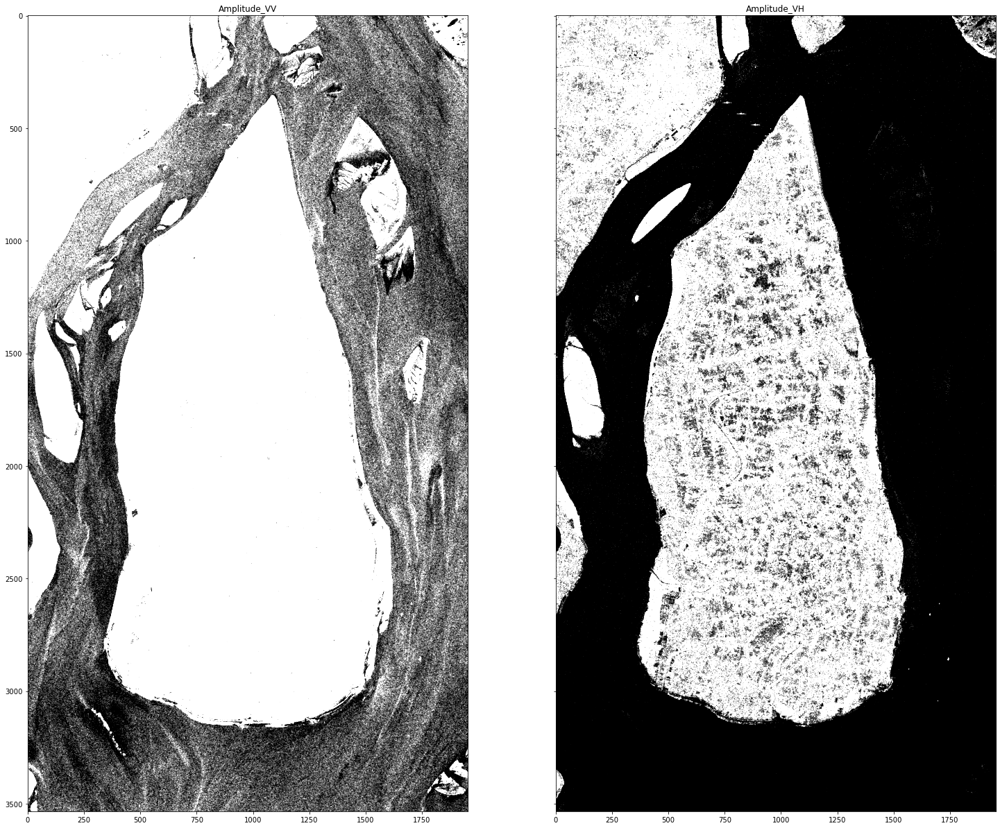

In [13]:
parameters = snappy.HashMap()
parameters.put('Apply-Orbit-File', True)
apply_orbit = snappy.GPF.createProduct('Apply-Orbit-File', parameters, subset)
print(colored('Orbit updated succesfully', 'green'))

#Plot to check any changes

output_bands = ['Amplitude_VV', 'Amplitude_VH']
output_view(apply_orbit, output_bands, 50, 100,50,100)

In [14]:
# To save space 
del subset

### Thermal Noise Removal

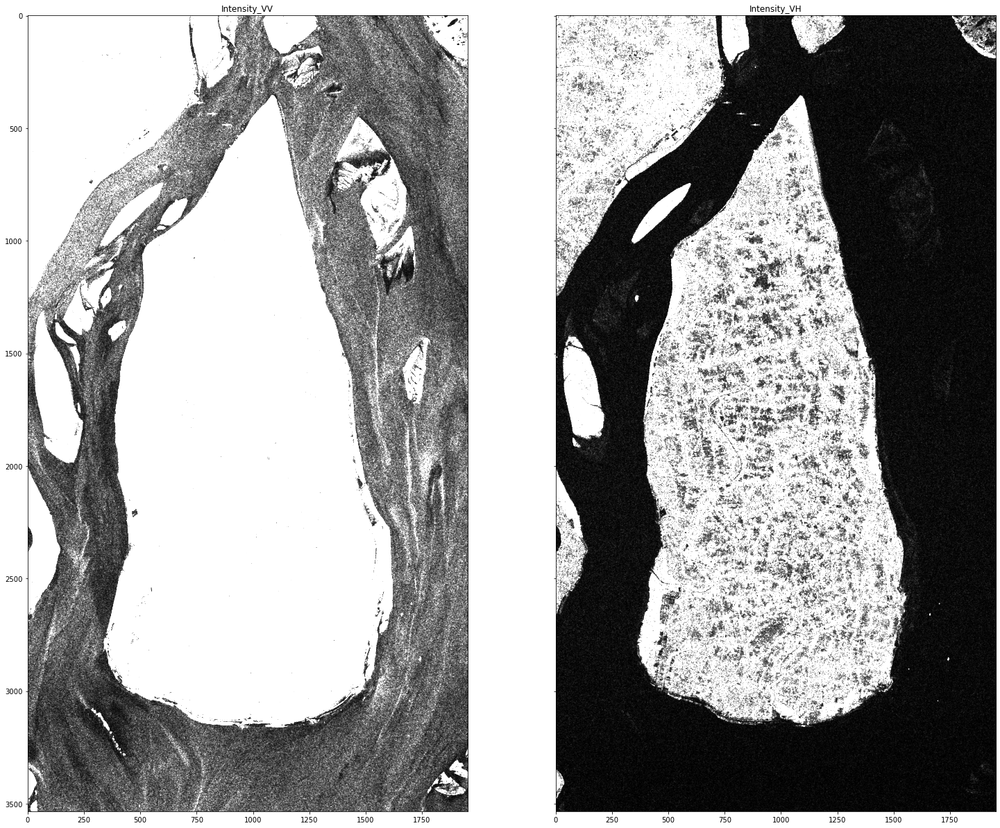

In [15]:
parameters = snappy.HashMap()
parameters.put('removeThermalNoise', True)
thermal_noise = snappy.GPF.createProduct('ThermalNoiseRemoval', parameters, apply_orbit)
#Plot Results
output_bands = ['Intensity_VV', 'Intensity_VH']
output_view(thermal_noise, output_bands, 0, 10000,0,10000)

In [16]:
band_vv = thermal_noise.getBand("Intensity_VV")
w = band_vv.getRasterWidth()
h = band_vv.getRasterHeight()
band_data_vv = np.zeros(w*h, np.float32)
band_vv.readPixels(0, 0, w, h, band_data_vv)
band_data_vv.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

band_vh =  thermal_noise.getBand("Intensity_VH")
w = band_vh.getRasterWidth()
h = band_vh.getRasterHeight()
band_data_vh = np.zeros(w*h, np.float32)
band_vh.readPixels(0, 0, w, h, band_data_vh)
band_data_vh.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

print("Band: Intensity_VV")
print(f"Min: {np.nanmin(band_data_vv)}")
print(f"Mean: {np.nanmean(band_data_vv)}")
print(f"Median: {np.nanmedian(band_data_vv)}")
print(f"Max: {np.nanmax(band_data_vv)}")
print("--------------------------------------")
print("Band: Intensity_VH")
print(f"Min: {np.nanmin(band_data_vh)}")
print(f"Mean: {np.nanmean(band_data_vh)}")
print(f"Median: {np.nanmedian(band_data_vh)}")
print(f"Max: {np.nanmax(band_data_vh)}")

Band: Intensity_VV
Min: 9.999999747378752e-06
Mean: 32147.068359375
Median: 9819.625
Max: 59458356.0
--------------------------------------
Band: Intensity_VH
Min: 9.999999747378752e-06
Mean: 5281.109375
Median: 1249.71875
Max: 4221826.5


In [17]:
# To save space 
del apply_orbit

### Radiometric Calibration

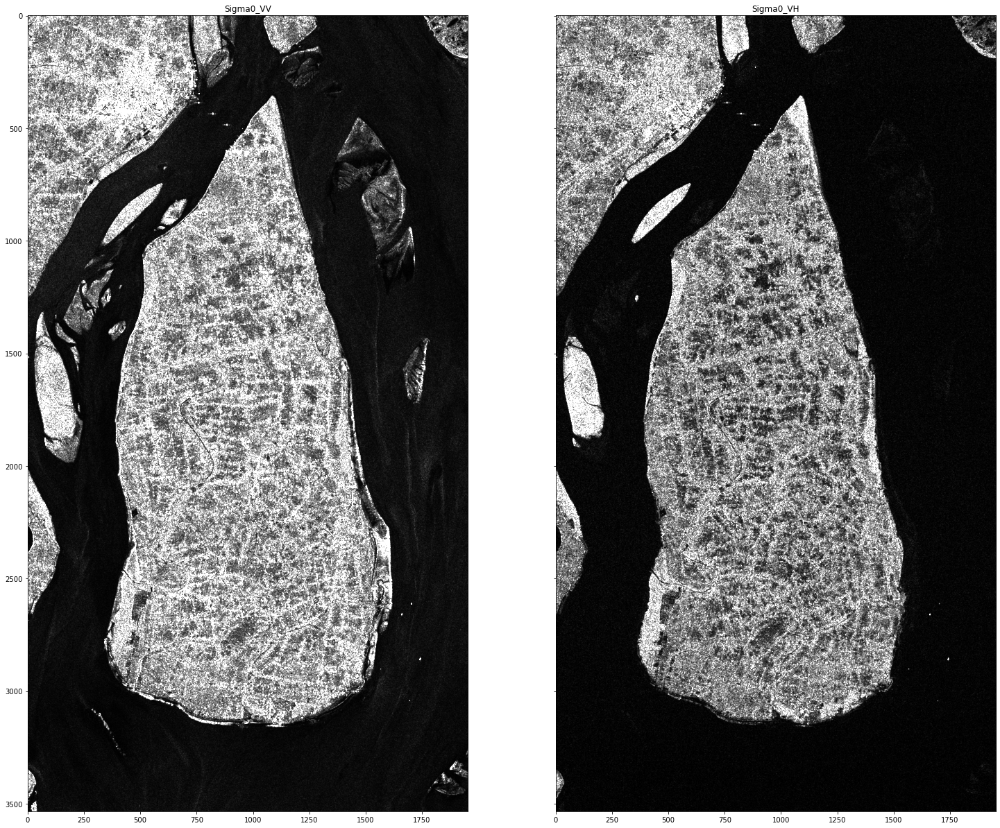

In [18]:
parameters = snappy.HashMap()
parameters.put('outputSigmaBand', True)
parameters.put('sourcebands', 'Intensity_VH, Intensity_VV')
parameters.put('selectedPolarisations', 'VH,VV')
parameters.put('outputImageDcaleInDb', False)
calibrated = snappy.GPF.createProduct('Calibration', parameters, thermal_noise)

#Plot to see any changes
output_bands = ['Sigma0_VV', 'Sigma0_VH']
output_view(calibrated, output_bands, 0.00, 0.2,0.00,0.05)

In [19]:
# To save space 
del thermal_noise

In [20]:
band_vv = calibrated.getBand("Sigma0_VV")
w = band_vv.getRasterWidth()
h = band_vv.getRasterHeight()
band_data_vv = np.zeros(w*h, np.float32)
band_vv.readPixels(0, 0, w, h, band_data_vv)
band_data_vv.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

band_vh =  calibrated.getBand("Sigma0_VH")
w = band_vh.getRasterWidth()
h = band_vh.getRasterHeight()
band_data_vh = np.zeros(w*h, np.float32)
band_vh.readPixels(0, 0, w, h, band_data_vh)
band_data_vh.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

print("Band: Sigma0_VV")
print(f"Min: {np.nanmin(band_data_vv)}")
print(f"Mean: {np.nanmean(band_data_vv)}")
print(f"Median: {np.nanmedian(band_data_vv)}")
print(f"Max: {np.nanmax(band_data_vv)}")
print("--------------------------------------")
print("Band: Sigma0_VH")
print(f"Min: {np.nanmin(band_data_vh)}")
print(f"Mean: {np.nanmean(band_data_vh)}")
print(f"Median: {np.nanmedian(band_data_vh)}")
print(f"Max: {np.nanmax(band_data_vh)}")

Band: Sigma0_VV
Min: 3.959257099950264e-08
Mean: 0.08187861740589142
Median: 0.025149237364530563
Max: 152.1916046142578
--------------------------------------
Band: Sigma0_VH
Min: 1.2456177200803609e-09
Mean: 0.01344259548932314
Median: 0.0031968974508345127
Max: 10.759834289550781


### Speckle Filtering

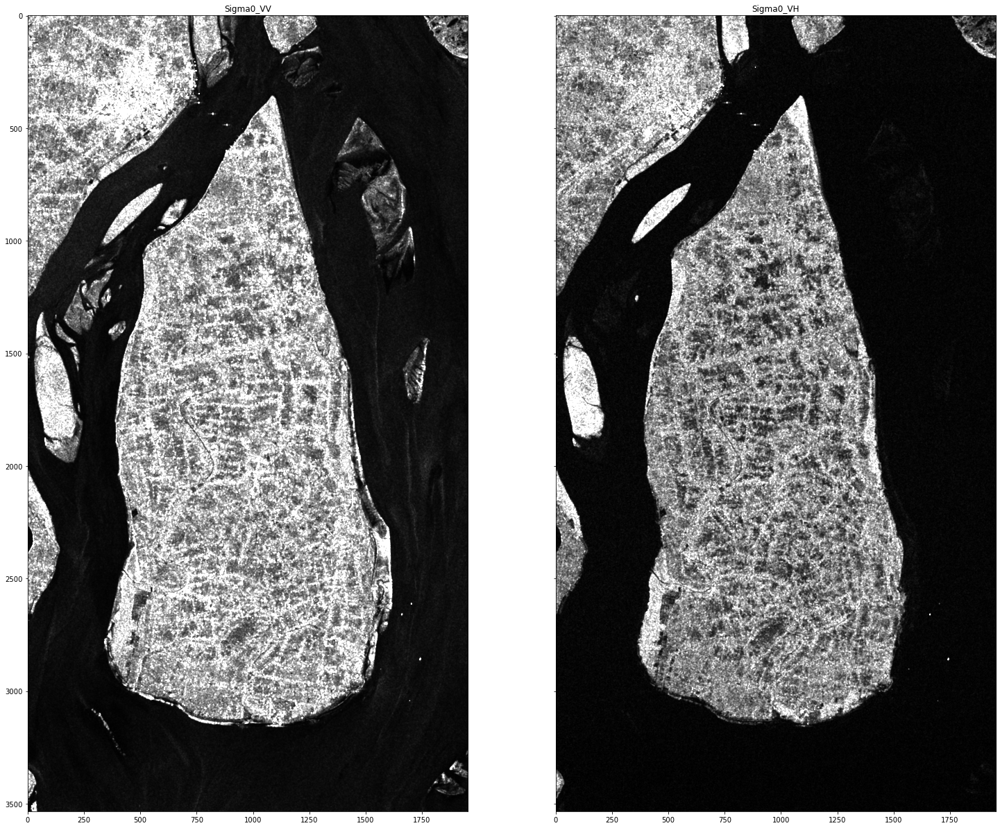

In [21]:
parameters = snappy.HashMap()
parameters.put('filter', 'Lee')
parameters.put('filterSizeX', 5)
parameters.put('filterSizeY', 5)
speckle = snappy.GPF.createProduct('Speckle-Filter',parameters, calibrated)
#Plot to see any changes
output_bands = ['Sigma0_VV', 'Sigma0_VH']
output_view(speckle, output_bands, 0.00, 0.2,0.00,0.05)


In [22]:
# To save space 
del calibrated

### Terrain Correction (Ignoring this part due to memory error)

In [ ]:
## Need to get the proper projection string
proj = '''PROJCS["UTM Zone 4 / World Geodetic System 1984",GEOGCS["World Geodetic System 1984",DATUM["World Geodetic System 1984",SPHEROID["WGS 84", 6378137.0, 298.257223563, AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich", 0.0, AUTHORITY["EPSG","8901"]],UNIT["degree", 0.017453292519943295],AXIS["Geodetic longitude", EAST],AXIS["Geodetic latitude", NORTH]],PROJECTION["Transverse_Mercator"],PARAMETER["central_meridian", -159.0],PARAMETER["latitude_of_origin", 0.0],PARAMETER["scale_factor", 0.9996],PARAMETER["false_easting", 500000.0],PARAMETER["false_northing", 0.0],UNIT["m", 1.0],AXIS["Easting", EAST],AXIS["Northing", NORTH]]'''


In [ ]:
parameters = snappy.HashMap()
parameters.put('demName', 'GETASSE30')
parameters.put('imgResamplingMethod', 'BILINEAR_INTERPOLATION')
parameters.put('pixelSpacingInMeter', 20.0)
parameters.put('mapProjection', proj)       # comment this line if no need to convert to UTM/WGS84, default is WGS84
parameters.put('nodataValueAtSea', True)
parameters.put('saveSelectedSourceBand', True)

terrain_correction = snappy.GPF.createProduct('Terrain-Correction', parameters, speckle)

## Plot for changes
output_bands = ['Sigma0_VV', 'Sigma0_VH']
output_view(terrain_correction, output_bands, 0.00, 0.5,0.00,0.04)

In [ ]:
band_vv = terrain_correction.getBand("Sigma0_VV")
w = band_vv.getRasterWidth()
h = band_vv.getRasterHeight()
band_data_vv = np.zeros(w*h, np.float32)
band_vv.readPixels(0, 0, w, h, band_data_vv)
band_data_vv.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

band_vh =  terrain_correction.getBand("Sigma0_VH")
w = band_vh.getRasterWidth()
h = band_vh.getRasterHeight()
band_data_vh = np.zeros(w*h, np.float32)
band_vh.readPixels(0, 0, w, h, band_data_vh)
band_data_vh.shape = h, w
#plt.hist(band_data)
#plt.rcParams['figure.figsize'] = [8, 10]

print("Band: Sigma0_VV")
print(f"Min: {np.nanmin(band_data_vv)}")
print(f"Mean: {np.nanmean(band_data_vv)}")
print(f"Median: {np.nanmedian(band_data_vv)}")
print(f"Max: {np.nanmax(band_data_vv)}")
print("--------------------------------------")
print("Band: Sigma0_VH")
print(f"Min: {np.nanmin(band_data_vh)}")
print(f"Mean: {np.nanmean(band_data_vh)}")
print(f"Median: {np.nanmedian(band_data_vh)}")
print(f"Max: {np.nanmax(band_data_vh)}")

In [ ]:
## Lat Long wise 